In [1]:
import cv2
import glob
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import math
from scipy.special import expit
import os
import matplotlib as mpl
import itertools

#for futureData function-create csv file
import base64
from IPython.display import HTML

In [77]:
# how we split data?
# we save in different folders images for train mode and validation mode. 
#we take 80% of images and save them in "trainData" folder, there we locate then in 2 folders "real" "fake".
# in same way, we take 20% of images and save them in "validation" folder, there we locate then in 2 folders "real" "fake".
# for futureData we add new folder named "futureData"


#train data
realPath = glob.glob("C:\\Users\\taliy\\Videos\\trainData\\real\\*.jpg")
fakePath = glob.glob("C:\\Users\\taliy\\Videos\\trainData\\fake\\*.jpg")


#validation data
validation_real_Path = glob.glob("C:\\Users\\taliy\\Videos\\trainData\\validation\\real\\*.jpg")
validation_fake_Path = glob.glob("C:\\Users\\taliy\\Videos\\trainData\\validation\\fake\\*.jpg")

#future test data
futureData_path = glob.glob("C:\\Users\\taliy\\Videos\\futureData\\*.jpg")


In [3]:
#global parameters:

#train data
global tmpCountR
global real_avg_counter
global fake_avg_counter
global radialProfileAVGR_array_all


#validation data
global valid_real_avg_counter
global valid_fake_avg_counter


#future test data
global future_probabilities_array
global update_future_probabilities_array

In [4]:
#train targets array
targets = np.ones(len(realPath)+len(fakePath))
#train target index - for add every magnitude the currect target
targetIndexCounter = 0
tmpCountR=0



#validation targets array
valid_targets = np.ones(len(validation_real_Path)+len(validation_fake_Path))
#validation target index - for add every magnitude the currect target
target_validation_IndexCounter = 0



#future test counters
target_future_IndexCounter=0

In [5]:
#To avoid possible numerical problems later, add 10^-8 to each value of the centered two-dimensional DFT.
epsilon = 10**(-8)
#Test mode indicates us the running condition we are in, 0=train mode, 1=validation mode, 2=future test mode.
test_mode=0

#train's counters :
#Will be used us to run on rows in the radius array we have created within the radius calculation function(radius_function())
real_avg_counter=0 #for real array
fake_avg_counter=0 #for fake array

#validation's counters :
#Will be used us to run on rows in the radius array we have created within the radius calculation function(radius_function())
valid_real_avg_counter=0 #for real array
valid_fake_avg_counter=0 #for fake array


In [6]:
#calculate the max center radius from magnitude - 
#Our images are 1024X1024, so the middle of the image has about 511 in each direction. 
#Therefore the maximum radius according to Pythagoras is -
maxRadius = math.floor(math.sqrt(511**2+511**2))

#### arrays in code ####

#train radius array
radius_array=np.ones((len(realPath)+len(fakePath),maxRadius))
radialProfileAVGR_array_all=np.ones((len(realPath)+len(fakePath),maxRadius))
#In order to identify a classification between real images and non-real images in the graph,
#we will divide the set of properties into 2 groups - a group of real images and a group of non-mythical images.
#Which will later be displayed in graphs in different colors.
radialProfileAVGR_array_real=np.ones((len(realPath),maxRadius)) #for graph
radialProfileAVGR_array_fake=np.ones((len(fakePath),maxRadius)) #for graph

#train probabilities array
probabilities_array=np.ones(len(targets)) #variables between 0-1
update_probabilities_array=np.ones(len(targets)) #Results of 1 or 0 


#validation radius array
validation_radAVGR_array_all=np.ones((len(validation_real_Path)+len(validation_fake_Path),maxRadius))
#In order to identify a classification between real images and non-real images in the graph,
#we will divide the set of properties into 2 groups - a group of real images and a group of non-mythical images.
#Which will later be displayed in graphs in different colors.
valid_radAVGR_array_real=np.ones((len(validation_real_Path),maxRadius)) 
valid_radAVGR_array_fake=np.ones((len(validation_fake_Path),maxRadius)) 

#validation probabilities array
valid_probabilities_array=np.ones(len(valid_targets)) #variables between 0-1
valid_update_probabilities_array=np.ones(len(valid_targets)) #Results of 1 or 0 


#future test radius array
future_radAVGR_array_all = np.ones((len(futureData_path),maxRadius))
#future test probabilities array
future_probabilities_array=np.ones((len(futureData_path)))
update_future_probabilities_array=np.ones((len(futureData_path)))
imges_name = np.ones((len(futureData_path)))

#### arrays in code ####

In [11]:
# input-
#       magnitude
#       row_index=target array index, for add the relevent featurs to same indx as target array.
#       real_or_fake= the current path we send to radius calculate, 0=real, 1=fake.   
#       test_mode = 0=train mode, 1=validation mode, 2=future test mode.
# output- no output
# summery- This function calculates for each magnitude its spectral properties and puts them into an array
#          that will include all the properties for each image in the path.


def radius_function(magnitude,row_index,real_or_fake,test_mode):
    #validation valus
    global valid_real_avg_counter
    global valid_fake_avg_counter
    global validation_radAVGR_array_all
    # train values
    global real_avg_counter
    global fake_avg_counter
    global radialProfileAVGR_array_all
    #future data
    global future_radAVGR_array_all
    global target_future_IndexCounter

    
    # Image center
    cen_x = 511
    cen_y = 511
    # Get image parameters
    a = magnitude.shape[0]
    b = magnitude.shape[1]
    # Find radial distances
    [X, Y] = np.meshgrid(np.arange(b) - cen_x, np.arange(a) - cen_y)
    R = np.sqrt(np.square(X) + np.square(Y)) -2
    rad = np.arange(1, np.max(R), 1)
    #print(rad)
    intensity = np.zeros(len(rad))
    index = 0
    for i in rad:
      mask = (np.greater(R, i - 1) & np.less(R, i + 1))
      values = magnitude[mask]
      intensity[index] = np.mean(values)
      index += 1    
    print(intensity)
    #print(len(intensity))
    
    #test_mode==0 ----> we sent the train data
    if test_mode==0:
        for i in range(len(intensity)):
            radialProfileAVGR_array_all[row_index][i]=intensity[i]*0.01
            radius_array[row_index][i]=intensity[i]
            
            if real_or_fake ==0:
                radialProfileAVGR_array_real[real_avg_counter][i]=intensity[i]
            else:
                radialProfileAVGR_array_fake[fake_avg_counter][i]=intensity[i]

        if real_or_fake ==0:
            real_avg_counter=real_avg_counter+1
        else:
            fake_avg_counter=fake_avg_counter+1

            
    #test_mode==1 ----> we sent the validation data
    if test_mode==1:  
        for i in range(len(intensity)):
            validation_radAVGR_array_all[row_index][i]=intensity[i]*0.01
            if real_or_fake ==0:
                valid_radAVGR_array_real[valid_real_avg_counter][i]=intensity[i]
            else:
                valid_radAVGR_array_fake[valid_fake_avg_counter][i]=intensity[i]

        if real_or_fake ==0:
            valid_real_avg_counter=valid_real_avg_counter+1
        else:
            valid_fake_avg_counter=valid_fake_avg_counter+1
        
     #test_mode==2 ----> we sent the future data
    if test_mode==2:  
        for i in range(len(intensity)):
            future_radAVGR_array_all[row_index][i]=intensity[i]*0.01


               

In [8]:
#################################### train data ####################################

In [9]:
#upload and calculate the fft shipt of all image in real path
for filename in realPath:
    img = cv2.imread(filename,0)
    targets[targetIndexCounter] = 0
    #img_color = mpimg.imread(filename)
    # Calculate FFT
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    fshift += epsilon
    magnitude = 20*np.log(np.abs(fshift))
    
    #raduis function
    real_var=0
    test_mode=0 # 0=train mode, 1=validation mode, 2=future test mode
    radius_function(magnitude,targetIndexCounter,real_var,test_mode)
    targetIndexCounter = targetIndexCounter + 1

[305.53209102 299.14833263 294.47371035 288.68582991 284.42144301
 280.1993703  275.95741194 271.97526027 268.72403303 267.13505444
 264.06732362 262.66237467 260.41450508 258.49110534 256.32592059
 253.88961785 252.25714544 250.97089885 250.06510745 247.61762499
 246.54473445 245.35067475 243.09245851 241.08991662 241.98940311
 241.43200397 238.73563271 237.95213094 237.26898014 236.92226861
 236.81485162 235.52692353 234.77052932 233.19483241 231.00917331
 230.46058571 230.99930992 230.06095953 228.19072878 227.47778829
 227.26659086 226.35323084 225.17733997 224.54829152 224.93162311
 223.74552373 223.29394631 223.31208137 222.4834373  222.47964343
 222.10858803 220.96531366 220.42287051 219.99573793 219.49943523
 218.83531541 217.95455838 217.65955873 217.81446015 217.86201097
 216.63160185 216.44588587 217.33946034 217.17902984 216.452077
 215.72112478 215.15484055 214.05145198 213.55345255 213.05995216
 212.30982167 212.1264692  211.94249506 212.08826574 211.61160035
 210.7143678

In [10]:
#upload and calculate the fft shipt of all image in fake path
for filename in fakePath:
    img = cv2.imread(filename,0)
    targets[targetIndexCounter] = 1
    #img_color = mpimg.imread(filename)
    # Calculate FFT
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    fshift += epsilon
    magnitude = 20*np.log(np.abs(fshift))

    
    #raduis function
    fake_var=1
    test_mode=0 # # 0=train mode, 1=validation mode, 2=future test mode
    radius_function(magnitude,targetIndexCounter,fake_var,test_mode)
    targetIndexCounter = targetIndexCounter + 1

[294.01289684 290.64997077 281.99980121 277.09312021 272.69668266
 268.19974478 265.0589119  262.08469313 258.50968558 256.0406594
 255.57481639 253.19581448 251.71605881 250.79203832 249.08585103
 247.08358893 245.93068134 243.6531572  241.22450852 239.39771424
 238.1720967  237.34222663 236.79213798 235.92742978 234.61768574
 232.93478996 231.60889428 230.58105    229.41541651 228.64150089
 227.94736423 226.14465441 225.36446336 223.62974078 223.28950298
 223.59358439 222.85837876 222.40098777 221.85443404 220.83945881
 219.55147884 218.49079364 218.74844575 218.12274025 217.2897514
 218.36332491 217.5092896  215.1155872  213.68318248 214.29156699
 214.44240115 213.81729935 213.38065698 212.90630031 212.44303167
 211.09733642 210.61210162 210.44747397 210.02677657 209.74479965
 209.19116246 208.44739404 208.15721914 207.73254738 207.41257297
 206.91371347 206.15537314 205.72539159 205.03128995 204.73049078
 205.33145626 204.82901949 203.69758964 203.15412693 203.0998778
 203.73862902

In [15]:
### train Visualization graph ###
# red = real
#blue = fake

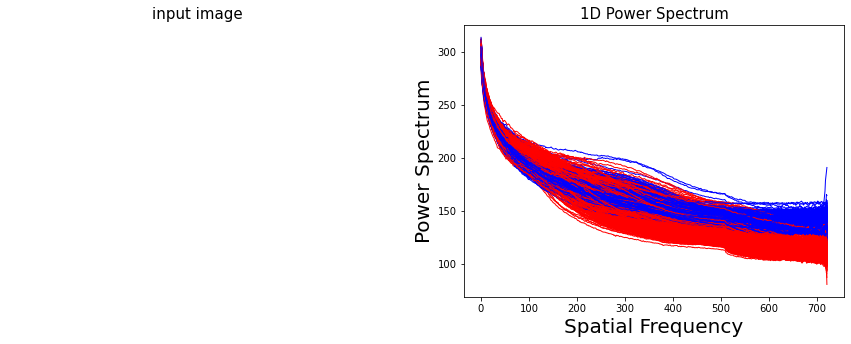

In [16]:
#train Visualization graph - magnitude radius array
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(121)
plt.axis('off')
ax2 = fig.add_subplot(122)
ax.set_title('input image',size=15)
ax2.set_title('1D Power Spectrum',size=15)
plt.xlabel('Spatial Frequency', fontsize=20)
plt.ylabel('Power Spectrum', fontsize=20)

for i in range(len(radialProfileAVGR_array_real)):
    ax2.plot(radialProfileAVGR_array_real[i], color='red', label='real', linewidth =1.0)
    ax2.plot(radialProfileAVGR_array_fake[i], color='blue', label='fake', linewidth =1.0)
plt.show()

In [18]:
# chagne train features to X and train targets to Y for gradient dunction 
x=radialProfileAVGR_array_all #features
y=targets
n,m = x.shape


In [19]:
# input- accepts the product of Xn and Wn
# output- returns a numeric value between 0-1
# summery- This function calculate the sigmoid result for featurs (Xn) and Wn

def sigmoid(z):
    return 1/(1+np.exp(-z))

In [20]:
# input- Xn (featurs) and Wn
# output- return the product of Xn and Wn 
# summery- This function calculate the product for featurs (Xn) and Wn

def dotForSigmoid(x,theta):
    #print(np.dot(x,theta))
    return np.dot(x,theta)

In [21]:

num_params = 0
z = np.ones(m)
z=z.reshape(m,1)


# For each row in the featurs array X, add a column with the value 1
x=np.ones((len(radialProfileAVGR_array_all),len(radialProfileAVGR_array_all[0])+1))
num_params = len(radialProfileAVGR_array_all[0])
m = len(radialProfileAVGR_array_all)
for i in range(0, len(radialProfileAVGR_array_all)):
            #predicted = self.get_prediction(theta, self.dataset[i])
            #actual = self.dataset[i][-1]
            x[i][0]=1
            for j in range(0, num_params):
                x[i][j+1]=radialProfileAVGR_array_all[i][j]
print(x)     

[[1.         3.05532091 2.99148333 ... 1.15410803 1.11935436 1.13172141]
 [1.         2.99104295 2.94411675 ... 1.21960988 1.16638697 1.15785021]
 [1.         2.97120964 2.90990506 ... 1.15307763 1.1646934  1.08328585]
 ...
 [1.         3.0472703  2.9534658  ... 1.33433984 1.35814473 1.31951542]
 [1.         3.04362422 2.99737976 ... 1.42381149 1.43043335 1.44213011]
 [1.         3.04880144 2.97362109 ... 1.32489165 1.33456961 1.35681261]]


In [22]:
#test for check the add of '1' to first x column
print('x[0] = {}   y[0] = {}'.format(x[0],y[0]))
x.shape

x[0] = [1.         3.05532091 2.99148333 2.9447371  2.8868583  2.84421443
 2.8019937  2.75957412 2.7197526  2.68724033 2.67135054 2.64067324
 2.62662375 2.60414505 2.58491105 2.56325921 2.53889618 2.52257145
 2.50970899 2.50065107 2.47617625 2.46544734 2.45350675 2.43092459
 2.41089917 2.41989403 2.41432004 2.38735633 2.37952131 2.3726898
 2.36922269 2.36814852 2.35526924 2.34770529 2.33194832 2.31009173
 2.30460586 2.3099931  2.3006096  2.28190729 2.27477788 2.27266591
 2.26353231 2.2517734  2.24548292 2.24931623 2.23745524 2.23293946
 2.23312081 2.22483437 2.22479643 2.22108588 2.20965314 2.20422871
 2.19995738 2.19499435 2.18835315 2.17954558 2.17659559 2.1781446
 2.17862011 2.16631602 2.16445886 2.1733946  2.1717903  2.16452077
 2.15721125 2.15154841 2.14051452 2.13553453 2.13059952 2.12309822
 2.12126469 2.11942495 2.12088266 2.116116   2.10714368 2.10414952
 2.10141694 2.10302543 2.09762458 2.09056531 2.08908808 2.08955567
 2.08502535 2.07903477 2.08051074 2.07430735 2.07186604 2

(748, 723)

In [23]:
# initial Wm array

m,n = x.shape
theta = np.zeros(n) #theta = W(m) in gradient function
theta=theta.reshape(n,1)
print(theta)
print(len(theta))
# target array transpose
y=y.reshape(-1,1) #y = targets in gradient function

[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.

In [24]:
# input- featurs (Xn) , Wn and targent (y)
# output- return sum of cost calculate
# summery- This function calculate the cost for featurs (Xn) , Wn and targent (y)

def compute_cost(theta,x, y):
    infunc = -y*(np.log(sigmoid(dotForSigmoid(x,theta)))) - (1-y)*np.log(1- sigmoid(dotForSigmoid(x,theta)))
    j = np.sum(infunc)/m
    return j

# initial cost, for function checks.
L = compute_cost(theta,x, y)
print(L)

0.6931471805599454


In [25]:
iteration = 11000 #iteration = m steps in gradient function
alpha = 3 #alpha = size of step in gradint function

mse_value=np.zeros(iteration)
probabilities_for_mse=np.zeros(len(targets))

In [26]:
# input- actual = targets , predicted = probabilities_for_mse from calculate sigmoid error in gradient function 
# output- return the mean error
# summery- This function calculate the error obtain from the gradient function as function of number of M steps

def mse_function(actual, predicted): 
    sum_error = 0.0 
    for i in range(len(actual)): 
        prediction_error = predicted[i] - actual[i] 
        sum_error += (prediction_error ** 2) 
    mean_error = sum_error / float(len(actual)) 
    return mean_error



In [27]:
# input- actual = x=featurs,y=targets,theta=Wn,alpha=size of step,iteration=m steps in gradient function.
# output- return W array
# summery- gradient function

def gradiendDescent(x,y,theta,alpha,iteration):
    treshold=0.5
    for i in range(iteration):
        infunc1 = sigmoid(dotForSigmoid(x,theta))-y
        #print(infunc1)
        gradient = np.dot(x.transpose(), infunc1)/m
        theta = theta - (alpha/m) * gradient
        probabilities_for_mse=sigmoid(dotForSigmoid(x,theta))
        mse_value[i]=mse_function(targets, probabilities_for_mse)
        #print("mse value")
        #print(mse_value)
    return theta

theta = gradiendDescent(x,y,theta,alpha,iteration)
print(theta)

[[-2.16611752e-02]
 [-3.99379880e-02]
 [-3.29228839e-02]
 [-4.30514446e-02]
 [-4.40233815e-02]
 [-4.53890415e-02]
 [-4.30177793e-02]
 [-4.84131732e-02]
 [-5.07081453e-02]
 [-4.51563480e-02]
 [-4.55432630e-02]
 [-4.55057616e-02]
 [-4.04714900e-02]
 [-4.03630459e-02]
 [-3.86741042e-02]
 [-3.72283818e-02]
 [-3.89109279e-02]
 [-3.68836925e-02]
 [-3.85771383e-02]
 [-3.52696695e-02]
 [-3.78561438e-02]
 [-4.06793657e-02]
 [-3.80459732e-02]
 [-3.84983600e-02]
 [-3.95783237e-02]
 [-4.29453468e-02]
 [-4.59574690e-02]
 [-4.58313436e-02]
 [-4.86714043e-02]
 [-4.75186946e-02]
 [-4.63173412e-02]
 [-4.72854594e-02]
 [-4.90834022e-02]
 [-4.68911749e-02]
 [-4.81856937e-02]
 [-4.90503342e-02]
 [-4.66654492e-02]
 [-4.80464203e-02]
 [-4.99481316e-02]
 [-4.92864313e-02]
 [-4.85568841e-02]
 [-4.69933460e-02]
 [-4.91285693e-02]
 [-5.04178247e-02]
 [-5.29813732e-02]
 [-5.65107801e-02]
 [-5.44542554e-02]
 [-5.47677515e-02]
 [-5.45186711e-02]
 [-5.40348819e-02]
 [-5.32858310e-02]
 [-5.32655883e-02]
 [-5.4710846

In [28]:
#calculate the cost function, after gradient function.
L = compute_cost(theta,x, y)
print(L)


0.07969573259389465
[[-2.16611752e-02]
 [-3.99379880e-02]
 [-3.29228839e-02]
 [-4.30514446e-02]
 [-4.40233815e-02]
 [-4.53890415e-02]
 [-4.30177793e-02]
 [-4.84131732e-02]
 [-5.07081453e-02]
 [-4.51563480e-02]
 [-4.55432630e-02]
 [-4.55057616e-02]
 [-4.04714900e-02]
 [-4.03630459e-02]
 [-3.86741042e-02]
 [-3.72283818e-02]
 [-3.89109279e-02]
 [-3.68836925e-02]
 [-3.85771383e-02]
 [-3.52696695e-02]
 [-3.78561438e-02]
 [-4.06793657e-02]
 [-3.80459732e-02]
 [-3.84983600e-02]
 [-3.95783237e-02]
 [-4.29453468e-02]
 [-4.59574690e-02]
 [-4.58313436e-02]
 [-4.86714043e-02]
 [-4.75186946e-02]
 [-4.63173412e-02]
 [-4.72854594e-02]
 [-4.90834022e-02]
 [-4.68911749e-02]
 [-4.81856937e-02]
 [-4.90503342e-02]
 [-4.66654492e-02]
 [-4.80464203e-02]
 [-4.99481316e-02]
 [-4.92864313e-02]
 [-4.85568841e-02]
 [-4.69933460e-02]
 [-4.91285693e-02]
 [-5.04178247e-02]
 [-5.29813732e-02]
 [-5.65107801e-02]
 [-5.44542554e-02]
 [-5.47677515e-02]
 [-5.45186711e-02]
 [-5.40348819e-02]
 [-5.32858310e-02]
 [-5.326558

In [ ]:
#Visualization of MSE graph#

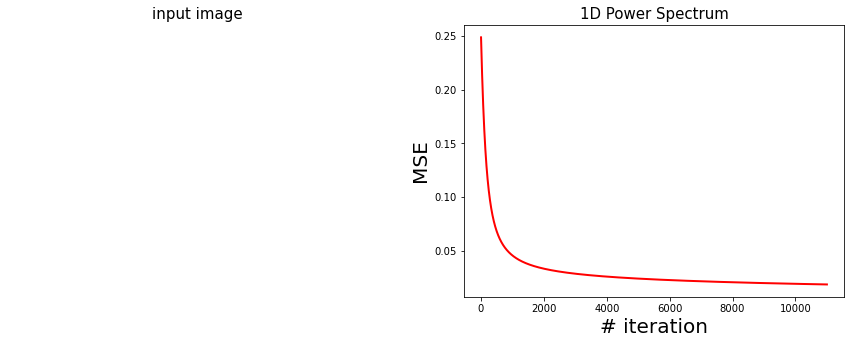

In [29]:

# graph that will examine the magnitude of the error obtained from the gradient descent calculation, 
#as a function of the number of M steps we have determined

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(121)
plt.axis('off')
ax2 = fig.add_subplot(122)
ax2.set_title('1D Power Spectrum',size=15)
plt.xlabel('# iteration', fontsize=20)
plt.ylabel('MSE', fontsize=20)
ax2.plot(mse_value, color='red', label='real', linewidth =2.0)
plt.show()


In [30]:
# input- predicted_values=update_probabilities_array(results of 1 or 0 ) , truth_values=targets
# output- return TP,FN,FP,TN 
# summery- Auxiliary function for print_matrix_data function.
#          The function counts the number of cases of TP,FP,FN,TN

def confusion_matrix_function(predicted_values, truth_values):
    TP=0
    FP=0
    FN=0
    TN=0
    for x in range(len(predicted_values)):
        if predicted_values[x] == 1 and truth_values[x]==1: #true possitive
            TP=TP+1
        elif predicted_values[x] == 0 and truth_values[x]==1: #false negative
            FN=FN+1
        elif predicted_values[x] == 1 and truth_values[x]==0: #false possitive
            FP=FP+1
        elif predicted_values[x] == 0 and truth_values[x]==0 : #true negative
            TN=TN+1
    return TP,FN,FP,TN 

In [68]:
# input- x=featurs, probabilities_array , theta = Wn
# output- returns a number between 0-1 that constitutes the probability
# summery- An array of probabilities function, with all imgs probabilities that return from sigmoid function,
#          numbers from 0-1 that match each img in array.
#          Which will later classify for us whether a img is real or not.


def probabilities_function(x, probabilities_array,theta):
    probabilities_array=sigmoid(dotForSigmoid(x,theta))
    print(sigmoid(dotForSigmoid(x,theta)))
    return probabilities_array


In [32]:
# input- probabilities_array = the predicted values we found from probabilities_function(),numbers between 0-1,
#        update_probabilities_array = new array for catch the function result,
#        threshold=0.5 as we see at class.
# output- update_probabilities_array array with classification values of 0 or 1.
# summery- A function that gets the classification values we got from the probabilities_function () function,
#         and a predefined variable called treshould which determines the result of our classification
#         by checking whether the variable we got is bigger or smaller than it.

The results go into an array called update_probabilities_array which will display final results for our classification, 1 or 0 according to the results we got in the test against the treshould.

def probabilities_with_threshold_function(probabilities_array,update_probabilities_array,threshold):
    #threshold=0.5

    for x in range(len(probabilities_array)):
        if probabilities_array[x] >= threshold:
            update_probabilities_array[x]=1
        else:
            update_probabilities_array[x]=0
    return update_probabilities_array

In [33]:
# input- truth_values=targets, probabilities_array
# output- plot ROC graph
# summery- ROC graph used for determining the best cutoff value for predicting whether a new observation
#          is a "failure" (1) or a "success" (0).

def ROC_curve(truth_values, probabilities_array):
    predicted_values=np.ones(len(truth_values))
    TP=0 ;FP=0; FN=0; TN=0
    #list of thresholds
    thresholds=np.array(list(range(0,105,1)))/100  
    roc_point=[]
    for threshold in thresholds:
        TP=0 ;FP=0; FN=0; TN=0
        predicted_values=probabilities_with_threshold_function(probabilities_array,predicted_values,threshold)
        for x in range(len(predicted_values)):
            if predicted_values[x] == 1 and truth_values[x]==1: #true possitive
                TP=TP+1
            elif predicted_values[x] == 0 and truth_values[x]==1: #false negative
                FN=FN+1
            elif predicted_values[x] == 1 and truth_values[x]==0: #false possitive
                FP=FP+1
            elif predicted_values[x] == 0 and truth_values[x]==0 : #true negative
                TN=TN+1
 
        TPR=(TP/(TP+FN)) #true possitive rate- also recall
        FPR=(FP/(TN+FP)) #false possitive rate
        roc_point.append([TPR,FPR])
                         
                         
    pivot=pd.DataFrame(roc_point, columns=["x","y"])
    
    #calaulate AUC
    auc=abs(np.trapz(pivot.x,pivot.y))
    print(auc)
    
    
    
    #plot ROC CRUVE
    plt.title('ROC')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.plot(pivot.y,pivot.x)
    #plt.scatter(pivot.y,pivot.x)
    plt.plot([0,1]) 

In [34]:
# input- TP,FN,FP,TN valus we calculate in confusion_matrix_function() 
# output- accuracy and precision values.
# summery- function calculates according to the variables TP,FN,FP,TN we got in confusion_matrix_function() the -
#          false possitive rate,false negative rate,true possitive rate,true negative rate
#          accuracy and precision values.

def print_matrix_data(TP,FN,FP,TN):
    FPR=(FP/(TN+FP)) #false possitive rate
    FNR=(FN/(TP+FN)) #false negative rate
    TPR=(TP/(TP+FN)) #true possitive rate- also recall
    TNR=(TN/(TN+FP)) #true negative rate
    accuracy=((TP+TN)/(TP+TN+FP+FN))
    precision=(TP/(TP+FP))
    print('true possitive -TP- '+ str( TP))
    print('false negative -FN- '+ str( FN))
    print('false possitive -FP- '+ str(FP))
    print('true negative -TN- '+ str( TN))
    print('The false positive rate is '+ str( FPR)+'%')
    print('The false negative rate is '+ str( FNR)+'%')
    print('The true positive rate is '+ str( TPR)+'%')
    print('The true negative rate is '+ str( TNR)+'%')
    print('The accuracy is '+ str( accuracy)+'%')
    print('The precision is '+ str( precision)+'%')

In [35]:
# input- array of TP,FN,FP,TN values, targets
# output- matrix plot
# summery- function that arranges the TP,FN,FP,TN values we obtained in function print_matrix_data()
#          to form a matrix print as we saw in class

def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    global accuracy

    import matplotlib.pyplot as plt
    import numpy as np
    import itertools
    
    print(cm)

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Greens')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

[[0.00787031]
 [0.01319269]
 [0.00821272]
 [0.38473699]
 [0.01222477]
 [0.00871515]
 [0.00675854]
 [0.00634483]
 [0.12480569]
 [0.09241768]
 [0.01360617]
 [0.00884699]
 [0.02105763]
 [0.08126223]
 [0.016239  ]
 [0.05284154]
 [0.16871734]
 [0.10899758]
 [0.01187208]
 [0.02263481]
 [0.22898505]
 [0.07562007]
 [0.01731047]
 [0.62643864]
 [0.02830199]
 [0.17962432]
 [0.6003924 ]
 [0.05365846]
 [0.00710711]
 [0.12119358]
 [0.08835042]
 [0.02035932]
 [0.03699878]
 [0.01381191]
 [0.01021835]
 [0.34226016]
 [0.02775634]
 [0.01901273]
 [0.04968635]
 [0.00455258]
 [0.01956248]
 [0.00461353]
 [0.08355657]
 [0.01761239]
 [0.38351038]
 [0.00476065]
 [0.05942568]
 [0.03832159]
 [0.03511437]
 [0.01057671]
 [0.05204397]
 [0.01807167]
 [0.01131609]
 [0.00346608]
 [0.39275496]
 [0.00875071]
 [0.49776383]
 [0.00456177]
 [0.0190853 ]
 [0.02119257]
 [0.0101916 ]
 [0.17225173]
 [0.01028198]
 [0.05603712]
 [0.87243987]
 [0.00931309]
 [0.05409364]
 [0.00459439]
 [0.03735313]
 [0.0544991 ]
 [0.08315998]
 [0.03

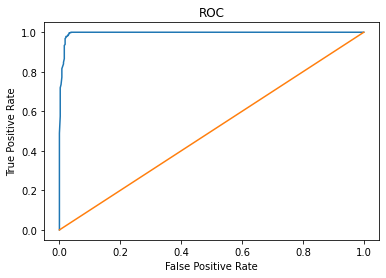

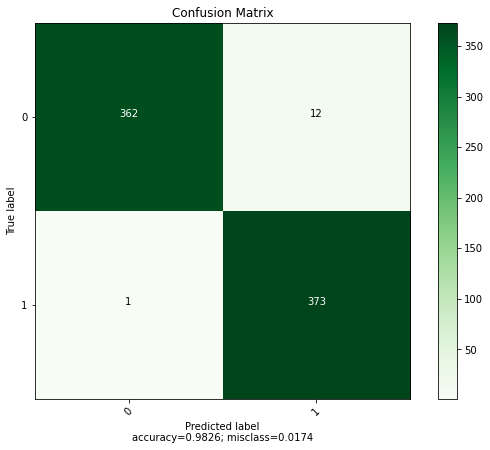

In [36]:
           ## probabilitiy main - Sequence: ##
# 1. find the probabilities of featurs and Wn from sigmoid function.
# 2. compares the values we got to the treshould set to 0.5
#    and classifies any value smaller than it to 0 and any value greater than it to 1.
#    and puts the values into an array called update_probabilities_array
# 3. find TP,FN,FP,TN values
# 4. find false possitive rate,false negative rate,true possitive rate,true negative rate
#    accuracy and precision values.
# 5. plot ROC graph
# 6. plot confusion matrix

threshold=0.5
TP=0
FP=0
FN=0
TN=0
#1
probabilities_array=probabilities_function(x, probabilities_array,theta)
#2
update_probabilities_array=probabilities_with_threshold_function(probabilities_array,update_probabilities_array,threshold)
#3
TP,FN,FP,TN=confusion_matrix_function(update_probabilities_array,targets)
#4
print_matrix_data(TP,FN,FP,TN)
#5
ROC_curve(targets,probabilities_array)
print(update_probabilities_array)
#6
plot_confusion_matrix(cm           = np.array([[ TN,  FP],
                                              [  FN,  TP]]), 
                      normalize    = False,
                      target_names = ['0', '1'],
                      title        = "Confusion Matrix")




#TP,FN,FP,TN=confusion_matrix_function(update_probabilities_array,targets)
#print("-confusion_matrix-")
#print_matrix_data(TP,FN,FP,TN)

In [37]:
#################################### validation data ####################################

In [38]:
#upload and calculate the fft shipt of all image in real path

for filename in validation_real_Path:
    img = cv2.imread(filename,0)
    #img_color = mpimg.imread(filename)
    # Calculate FFT
    valid_targets[target_validation_IndexCounter] = 0
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    fshift += epsilon
    magnitude_test = 20*np.log(np.abs(fshift))
    
    #raduis function
    valid_real_var=0
    test_mode=1 # 0=train mode, 1=validation mode, 2=future test mode
    radius_function(magnitude_test,target_validation_IndexCounter,valid_real_var,test_mode)
    target_validation_IndexCounter = target_validation_IndexCounter + 1

[291.40716579 285.87755669 281.40121564 275.2740559  269.18447649
 266.85391714 263.59123776 261.36566776 259.74179689 254.48511921
 251.38458977 248.80767514 246.28896859 245.17556969 244.93768693
 243.71287543 240.40643053 238.82414217 237.88701412 236.13509742
 235.75925533 233.83874938 232.55346043 229.89513985 229.35751533
 229.37298078 227.43450882 226.75583866 225.10990202 224.91889358
 224.72980495 223.94336974 224.36601598 224.0141923  223.16870281
 222.81661486 221.36900907 220.7670103  220.21318416 219.41516743
 218.85194401 217.67228123 217.27699306 216.82917622 216.57623231
 215.9021944  215.19542877 215.10480797 214.00722324 214.24811672
 213.7840935  213.1288304  212.82908252 211.34954248 210.4262184
 210.38472485 209.88544605 209.94326023 209.70540543 209.35961897
 209.23488498 207.76512833 206.64317509 207.08803402 207.12166445
 206.562437   206.68404597 206.37783518 205.67931492 205.33960465
 204.61069634 204.79072129 204.34199354 203.6451947  203.26533482
 203.075379

In [39]:
#upload and calculate the fft shipt of all image in fake path

for filename in validation_fake_Path:
    img = cv2.imread(filename,0)
    #img_color = mpimg.imread(filename)
    # Calculate FFT
    valid_targets[target_validation_IndexCounter] = 1
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    fshift += epsilon
    magnitude_test = 20*np.log(np.abs(fshift))
    
    #raduis function
    valid_fake_var=1
    test_mode=1 # 0=train mode, 1=validation mode, 2=future test mode
    radius_function(magnitude_test,target_validation_IndexCounter,valid_fake_var,test_mode)
    target_validation_IndexCounter = target_validation_IndexCounter + 1

[293.63877521 289.67017439 281.2863087  277.17594413 274.17376064
 271.92451769 268.45319631 265.07429758 264.19083379 261.505968
 258.32979354 256.65286095 254.20067073 250.42805839 249.25395471
 247.14545176 246.24008918 244.37734379 241.66083283 239.13981423
 238.015257   237.57405496 236.36199849 236.07028701 234.53824894
 233.73972075 233.86619181 233.58613086 232.52004615 231.35150009
 230.73154983 229.4848093  228.2360167  228.17536039 228.07519567
 226.55418035 225.21368567 224.73577135 223.90935364 222.43131585
 221.12124257 220.2831953  219.54589701 219.36250571 218.85785565
 217.93870683 217.63212528 217.74598673 217.76015505 217.01117085
 216.57126192 215.56682554 214.7944013  215.17059334 214.17630651
 213.48779437 212.96087369 212.40717106 212.38040636 211.46077311
 210.51294469 211.08745402 211.8637037  210.82126596 209.76631428
 209.63625584 209.99857731 209.97976661 209.36897093 208.41724868
 207.81451996 207.45169659 206.69899426 206.79879792 206.3458657
 205.63473356

In [40]:
print(valid_targets)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
### validation Visualization graph ###
#pink = real
#orange = fake

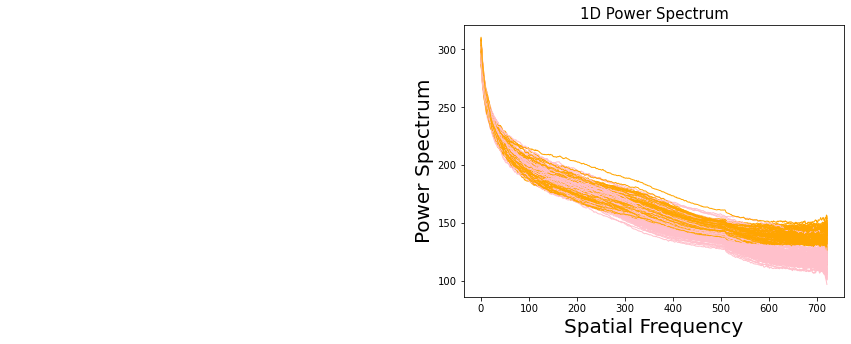

In [41]:
#validation Visualization graph - magnitude radius array
fig = plt.figure(figsize=(15,5))
plt.axis('off')
ax = fig.add_subplot(122)
ax.set_title('1D Power Spectrum',size=15)
plt.xlabel('Spatial Frequency', fontsize=20)
plt.ylabel('Power Spectrum', fontsize=20)
#ax.imshow(img_color)
for i in range(len(valid_radAVGR_array_real)):
    ax.plot(valid_radAVGR_array_real[i], color='pink', label='real', linewidth =1.0)
    ax.plot(valid_radAVGR_array_fake[i], color='orange', label='fak', linewidth =1.0)
plt.show()


In [42]:
# chagne validation features to test_features

test_features=validation_radAVGR_array_all
m,n = test_features.shape

In [43]:
num_params = 0
z = np.ones(m)
z=z.reshape(m,1)

# For each row in the featurs array test_features, add a column with the value 1
test_features=np.ones((len(validation_radAVGR_array_all),len(validation_radAVGR_array_all[0])+1))
num_params = len(validation_radAVGR_array_all[0])
m = len(validation_radAVGR_array_all)
for i in range(0, len(validation_radAVGR_array_all)):
            #predicted = self.get_prediction(theta, self.dataset[i])
            #actual = self.dataset[i][-1]
            test_features[i][0]=1
            for j in range(0, num_params):
                test_features[i][j+1]=validation_radAVGR_array_all[i][j]
print(test_features)  

[[1.         2.91407166 2.85877557 ... 1.19574791 1.12771901 1.13679385]
 [1.         3.048843   2.9836582  ... 1.01144476 0.99259023 0.96879925]
 [1.         3.04291083 2.98409045 ... 1.2530967  1.20537779 1.26508929]
 ...
 [1.         3.06214945 3.01876475 ... 1.35672827 1.32122033 1.34805718]
 [1.         3.05620412 3.00235567 ... 1.39059372 1.39781759 1.39793051]
 [1.         3.03742152 2.98005105 ... 1.39072004 1.38571668 1.39162097]]


[[0.0272182 ]
 [0.00794525]
 [0.36041849]
 [0.0194159 ]
 [0.10172418]
 [0.01928892]
 [0.01988647]
 [0.21933649]
 [0.03332439]
 [0.07714219]
 [0.03115389]
 [0.02261061]
 [0.00955299]
 [0.11504037]
 [0.04118782]
 [0.02944468]
 [0.01086139]
 [0.02713856]
 [0.01140483]
 [0.35763902]
 [0.96164212]
 [0.01025551]
 [0.07960244]
 [0.01845713]
 [0.02928594]
 [0.03393423]
 [0.01763229]
 [0.01272843]
 [0.04089831]
 [0.22937858]
 [0.03808761]
 [0.00836157]
 [0.04105157]
 [0.00468469]
 [0.14722528]
 [0.0058588 ]
 [0.16912434]
 [0.02883346]
 [0.02351296]
 [0.3615702 ]
 [0.07759019]
 [0.00798378]
 [0.13850141]
 [0.00650068]
 [0.20659289]
 [0.02146559]
 [0.49412197]
 [0.03421563]
 [0.00761169]
 [0.03763869]
 [0.05146098]
 [0.01372181]
 [0.80659151]
 [0.01725614]
 [0.00660563]
 [0.0098556 ]
 [0.04458788]
 [0.02801135]
 [0.11320592]
 [0.05894313]
 [0.02952792]
 [0.06417259]
 [0.00535091]
 [0.01653495]
 [0.16561806]
 [0.03672279]
 [0.01880048]
 [0.02924357]
 [0.01014326]
 [0.04120723]
 [0.05772969]
 [0.00

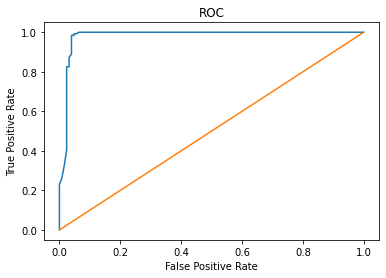

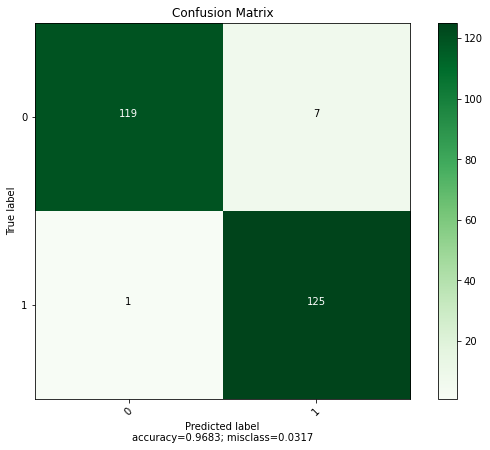

In [44]:
           ## probabilitiy main - Sequence: ##
# 1. find the probabilities of featurs and Wn from sigmoid function.
# 2. compares the values we got to the treshould set to 0.5
#    and classifies any value smaller than it to 0 and any value greater than it to 1.
#    and puts the values into an array called update_probabilities_array
# 3. find TP,FN,FP,TN values
# 4. find false possitive rate,false negative rate,true possitive rate,true negative rate
#    accuracy and precision values.
# 5. plot ROC graph
# 6. plot confusion matrix

threshold=0.5
TP_test=0
FP_test=0
FN_test=0
TN_test=0

valid_probabilities_array=probabilities_function(test_features, valid_probabilities_array,theta)
valid_update_probabilities_array=probabilities_with_threshold_function(valid_probabilities_array,valid_update_probabilities_array,threshold)
TP_test,FN_test,FP_test,TN_test=confusion_matrix_function(valid_update_probabilities_array,valid_targets)
print_matrix_data(TP_test,FN_test,FP_test,TN_test)
ROC_curve(valid_targets,valid_probabilities_array)
print(valid_update_probabilities_array)

plot_confusion_matrix(cm           = np.array([[ TN_test,  FP_test],
                                              [  FN_test,  TP_test]]), 
                      normalize    = False,
                      target_names = ['0', '1'],
                      title        = "Confusion Matrix")



In [69]:
#################################### future test data ####################################

In [70]:
# input- none
# output- radius array named "future_radAVGR_array_all"
# summery- upload and calculate the fft shipt of all images, here we dont know whitch img is real and whitch is fake.
#          called from futureData_function_apply()


def futureData_addData():
    #calculate radius fratures
    global target_future_IndexCounter
    
    #upload and calculate the fft shipt of all images
    for filename in futureData_path:
        img = cv2.imread(filename,0)
        # Calculate FFT
        f = np.fft.fft2(img)
        fshift = np.fft.fftshift(f)
        fshift += epsilon
        magnitude_test = 20*np.log(np.abs(fshift))
        #save img name in array, for CSV file
        imgName = os.path.basename("C:\\Users\\taliy\\Videos\\futureData\\{}.jpg" + filename) #save img name
        name,extension = imgName.split('.')
        print(name)
        imges_name[target_future_IndexCounter] = name
        
        
        #raduis function
        #valid_fake_var=1
        test_mode=2 # 0=train mode, 1=validation mode, 2=future test mode
        radius_function(magnitude_test,target_future_IndexCounter,valid_fake_var,test_mode)
        target_future_IndexCounter = target_future_IndexCounter + 1
    

In [71]:
# input- future_features
# output- probabilities and classify arrays
# summery- In this function, after training our classifier and getting an optimal Wm,
#          we left to calculate the probabilities and classify the images we loaded.
#          called from futureData_function_apply()


def probabilities_for_futureData(future_features):
    global update_future_probabilities_array
    future_probabilities_array=np.ones((len(futureData_path)))

    #return the probabilities
    print("")
    #calculate our probability against the sigmoid function with the help of the optimal W we trained
    # in train part
    print("probabilities of future data features")
    future_probabilities_array=probabilities_function(future_features, future_probabilities_array,theta)
        
    print("")
    #classify our probability against same threshold from train part.
    # in train part
    print("0=true, 1=false")
    #return probabilities of 0=true 1=false
    update_future_probabilities_array=probabilities_with_threshold_function(future_probabilities_array,update_future_probabilities_array,threshold)
    print(update_future_probabilities_array)

In [72]:
# input- none
# output- future_features array
# summery- upload img, create radius array(featurs), add to future_features column with the value 1
#          called from function6()

#print(futureData_function())
threshold=0.5

def futureData_function_apply():   
    target_future_IndexCounter=0
    futureData_path = glob.glob("C:\\Users\\taliy\\Videos\\futureData\\*.jpg")
    #future_radAVGR_array_all = np.ones((len(futureData_path),maxRadius))
    global future_probabilities_array
    global update_future_probabilities_array
    global future_radAVGR_array_all

    #print radius array after upload and calculate the fft shipt of all images
    print(futureData_addData())
    
    # chagne future test features to future_features
    future_features=future_radAVGR_array_all #features
    n,m = future_features.shape
    num_params = 0
    z = np.ones(m)
    z=z.reshape(m,1)
    
    #upload and calculate the fft shipt of all images
    future_features=np.ones((len(future_radAVGR_array_all),len(future_radAVGR_array_all[0])+1))
    num_params = len(future_radAVGR_array_all[0])
    m = len(future_radAVGR_array_all)
    
    # For each row in the featurs array future_features, add a column with the value 1
    for q in range(0, len(future_radAVGR_array_all)):
                future_features[q][0]=1
                for w in range(0, num_params):
                    future_features[q][w+1]=future_radAVGR_array_all[q][w]
    print(future_features)  
    
    
    
    
    #call to probabilities_for_futureData() for calculate the probabilities and classify the images we loaded.
    probabilities_for_futureData(future_features) 
    



In [73]:
        ######################### summery- our part 6 main function- #########################

#Activates the functions that lead to the following sequence of actions -
#1. Upload images from the path we received
#2. Calculate the spectral representation of the images
#3. Classifies the images according to the classifier we trained in the training section
#4. Writes the classification results to a CSV file

def function6():
    target_future_IndexCounter=0
    #future test radius array
    future_radAVGR_array_all = np.ones((len(futureData_path),maxRadius))
    #future test probabilities array
    #future_probabilities_array=np.ones((len(futureData_path)))
    update_future_probabilities_array=np.ones((len(futureData_path)))
    imges_name = np.ones((len(futureData_path)))
    futureData_function_apply()

In [76]:
    
function6()  

#futureData function-create csv file
#import base64
#import pandas as pd
#from IPython.display import HTML


def create_download_link( df, title = "FutureDataEstimatedLabels file", filename = "FutureDataEstimatedLabels.csv"):
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)


raw_data = {'name': imges_name,
                   'probabilities': update_future_probabilities_array}

df = pd.DataFrame(raw_data, columns = ['name', 'probabilities'])
create_download_link(df)    

500
[306.96228126 300.52291896 293.50682458 284.55909541 279.64042116
 273.67869392 269.39639766 267.24158365 265.83971176 262.74469096
 260.37798716 258.12062019 256.11279008 255.49750373 252.91288075
 252.42789271 251.5974546  249.12618099 247.05517118 245.4210902
 243.57078483 242.15207743 240.33887965 239.05321159 238.35946026
 237.02939394 236.40296103 236.1686714  234.58294574 233.54403611
 232.92722605 230.58159254 229.77847309 228.63491344 226.36712795
 226.38397649 225.95379923 224.75229386 224.55447955 223.75303141
 223.14549387 222.52609873 221.67634779 221.33089497 219.81542065
 218.2017801  217.872134   216.94428595 216.35518652 216.06803339
 215.01001899 213.94071463 213.30870202 212.95323386 213.00238992
 213.32632329 212.43473068 211.61408868 211.23182069 210.5799081
 210.75916925 210.53062004 210.14797219 209.79672326 208.78626886
 208.38221568 208.1538234  207.53304994 207.28765904 206.49486182
 206.02374173 205.55623211 204.43272308 204.06206143 203.98562082
 203.478